In [1]:
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime as dt
import math

from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
#from keras.layers import Bidirectional
#from keras.layers import Dropout
tf.random.set_seed(42)

from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')
plt.style.use('seaborn-colorblind')
sns.set_theme()
%matplotlib inline

#plt.rcParams["figure.figsize"] = (20, 10)
#plt.rcParams['figure.dpi'] = 150

In [2]:
%run ts_modelling.py

# Data load

In [3]:
df = pd.read_csv("NordPool/NO1/Spot_price_NO1.csv")
df = df[["price", "datetime"]]
df["datetime"] = pd.to_datetime(df["datetime"])
df.set_index("datetime", inplace = True)
data = df.iloc[:41592] # Keep untouched From October 2021


In [4]:
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
    X, y = list(), list()
    for i in range(len(sequences)):
        # find the end of this pattern
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out-1
        # check if we are beyond the dataset
        if out_end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1:out_end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

In [5]:
# General data normalization
p_min = data.min()
p_max = data.max()
ndata = (data-p_min)/(p_max-p_min)

# Modelling

In [6]:
train_size = 1968
test_size = 96
folds = 20
n_steps_in = 168
n_steps_out = 96
indexes=[]
preds = []
for ii, tr, te in datagen(train_size, test_size, folds):
    in_seq = ndata[tr:te].values
    x_input = ndata[te-n_steps_in:te].values  # Last sequence of in_seq, to use for prediction
    #out_seq = np.array([data[(n_steps_in)*i:(n_steps_in+n_steps_out)*i].values
               #for i in range(1, (len(in_seq) // n_steps_in))])
    y_true = ndata[te:te+n_steps_out] # Values to be predicted
    # convert to [rows, columns] structure
    in_seq = in_seq.reshape((len(in_seq), 1))
    #in_seq2 = in_seq2.reshape((len(in_seq2), 1))
    #out_seq = out_seq.reshape((len(out_seq), 1))
    dataset=np.hstack((in_seq, in_seq))
    X, y = split_sequences(dataset, n_steps_in, n_steps_out)
    n_features= X.shape[2]
    model = Sequential()
    model.add(LSTM(100, input_shape=(n_steps_in, n_features)))
    model.add(RepeatVector(n_steps_out))
    model.add(LSTM(100, return_sequences=True))
    model.add(TimeDistributed(Dense(n_features)))
    model.compile(optimizer='adam', loss='mse')
    # fit model
    model.fit(X, y, epochs=100, verbose=1)
    with open(f'modelsummary_Fold_{ii}.txt', 'w') as f:
        model.summary(print_fn=lambda x: f.write(x + '\n'))
    x_input = x_input.reshape((1, n_steps_in, n_features))
    preds.append([model.predict(x_input, verbose=0)]) # Save predictions for evaluation: rmse, mape...
    with open(f"preds_fold_{ii}.txt", "w") as output:
        output.write(str(preds))   # Save predictions in case memory breaks
    indexes.append([te, te+test_size]) # Save indexes for plotting

Epoch 1/100
54/54 [==============================] - 14s 186ms/step - loss: 0.0012
Epoch 2/100
54/54 [==============================] - 9s 173ms/step - loss: 2.6954e-04
Epoch 3/100
54/54 [==============================] - 9s 170ms/step - loss: 2.3991e-04
Epoch 4/100
54/54 [==============================] - 9s 170ms/step - loss: 2.2308e-04
Epoch 5/100
54/54 [==============================] - 9s 163ms/step - loss: 2.1749e-04
Epoch 6/100
54/54 [==============================] - 9s 162ms/step - loss: 2.0594e-04
Epoch 7/100
54/54 [==============================] - 9s 165ms/step - loss: 1.9911e-04
Epoch 8/100
54/54 [==============================] - 9s 164ms/step - loss: 2.0102e-04
Epoch 9/100
54/54 [==============================] - 9s 166ms/step - loss: 1.9401e-04
Epoch 10/100
54/54 [==============================] - 9s 164ms/step - loss: 1.9227e-04
Epoch 11/100
54/54 [==============================] - 9s 165ms/step - loss: 1.9508e-04
Epoch 12/100
54/54 [==============================] - 9

54/54 [==============================] - 8s 153ms/step - loss: 2.1867e-04
Epoch 90/100
54/54 [==============================] - 8s 153ms/step - loss: 2.1597e-04
Epoch 91/100
54/54 [==============================] - 8s 152ms/step - loss: 2.2934e-04
Epoch 92/100
54/54 [==============================] - 8s 154ms/step - loss: 2.1957e-04
Epoch 93/100
54/54 [==============================] - 9s 161ms/step - loss: 2.1340e-04
Epoch 94/100
54/54 [==============================] - 8s 152ms/step - loss: 2.1370e-04
Epoch 95/100
54/54 [==============================] - 8s 152ms/step - loss: 2.1802e-04
Epoch 96/100
54/54 [==============================] - 9s 158ms/step - loss: 2.1869e-04
Epoch 97/100
54/54 [==============================] - 8s 154ms/step - loss: 2.1290e-04
Epoch 98/100
54/54 [==============================] - 8s 152ms/step - loss: 2.1251e-04
Epoch 99/100
54/54 [==============================] - 8s 154ms/step - loss: 2.0865e-04
Epoch 100/100
54/54 [==============================] - 9

54/54 [==============================] - 8s 154ms/step - loss: 7.4227e-05
Epoch 84/100
54/54 [==============================] - 8s 153ms/step - loss: 7.5704e-05
Epoch 85/100
54/54 [==============================] - 8s 154ms/step - loss: 7.7063e-05
Epoch 86/100
54/54 [==============================] - 8s 153ms/step - loss: 7.4682e-05
Epoch 87/100
54/54 [==============================] - 8s 154ms/step - loss: 7.3814e-05
Epoch 88/100
54/54 [==============================] - 8s 156ms/step - loss: 7.5919e-05
Epoch 89/100
54/54 [==============================] - 8s 153ms/step - loss: 7.5468e-05
Epoch 90/100
54/54 [==============================] - 8s 153ms/step - loss: 7.5994e-05
Epoch 91/100
54/54 [==============================] - 8s 154ms/step - loss: 7.3598e-05
Epoch 92/100
54/54 [==============================] - 8s 153ms/step - loss: 7.4842e-05
Epoch 93/100
54/54 [==============================] - 9s 161ms/step - loss: 7.5475e-05
Epoch 94/100
54/54 [==============================] - 8s

54/54 [==============================] - 8s 158ms/step - loss: 0.0013
Epoch 75/100
54/54 [==============================] - 8s 157ms/step - loss: 0.0012
Epoch 76/100
54/54 [==============================] - 9s 163ms/step - loss: 0.0012
Epoch 77/100
54/54 [==============================] - 9s 158ms/step - loss: 0.0012
Epoch 78/100
54/54 [==============================] - 8s 155ms/step - loss: 0.0014
Epoch 79/100
54/54 [==============================] - 8s 157ms/step - loss: 0.0012
Epoch 80/100
54/54 [==============================] - 8s 157ms/step - loss: 0.0012
Epoch 81/100
54/54 [==============================] - 10s 178ms/step - loss: 0.0012
Epoch 82/100
54/54 [==============================] - 9s 171ms/step - loss: 0.0012
Epoch 83/100
54/54 [==============================] - 8s 157ms/step - loss: 0.0013
Epoch 84/100
54/54 [==============================] - 9s 158ms/step - loss: 0.0013
Epoch 85/100
54/54 [==============================] - 9s 159ms/step - loss: 0.0011
Epoch 86/100
54/

54/54 [==============================] - 9s 159ms/step - loss: 6.2650e-04
Epoch 62/100
54/54 [==============================] - 8s 156ms/step - loss: 6.3538e-04
Epoch 63/100
54/54 [==============================] - 8s 154ms/step - loss: 6.1632e-04
Epoch 64/100
54/54 [==============================] - 8s 153ms/step - loss: 6.1900e-04
Epoch 65/100
54/54 [==============================] - 8s 154ms/step - loss: 6.1884e-04
Epoch 66/100
54/54 [==============================] - 8s 153ms/step - loss: 6.0796e-04
Epoch 67/100
54/54 [==============================] - 8s 154ms/step - loss: 6.2426e-04
Epoch 68/100
54/54 [==============================] - 8s 155ms/step - loss: 6.1468e-04
Epoch 69/100
54/54 [==============================] - 8s 156ms/step - loss: 6.1298e-04
Epoch 70/100
54/54 [==============================] - 8s 153ms/step - loss: 6.0002e-04
Epoch 71/100
54/54 [==============================] - 8s 153ms/step - loss: 6.0733e-04
Epoch 72/100
54/54 [==============================] - 8s

54/54 [==============================] - 8s 156ms/step - loss: 7.3709e-04
Epoch 41/100
54/54 [==============================] - 8s 156ms/step - loss: 7.3185e-04
Epoch 42/100
54/54 [==============================] - 8s 156ms/step - loss: 7.4400e-04
Epoch 43/100
54/54 [==============================] - 8s 153ms/step - loss: 7.4063e-04
Epoch 44/100
54/54 [==============================] - 8s 155ms/step - loss: 7.3714e-04
Epoch 45/100
54/54 [==============================] - 8s 152ms/step - loss: 7.4254e-04
Epoch 46/100
54/54 [==============================] - 9s 158ms/step - loss: 7.3350e-04
Epoch 47/100
54/54 [==============================] - 8s 155ms/step - loss: 7.2730e-04
Epoch 48/100
54/54 [==============================] - 8s 155ms/step - loss: 7.2767e-04
Epoch 49/100
54/54 [==============================] - 8s 155ms/step - loss: 7.3651e-04
Epoch 50/100
54/54 [==============================] - 9s 158ms/step - loss: 7.3257e-04
Epoch 51/100
54/54 [==============================] - 8s

54/54 [==============================] - 9s 158ms/step - loss: 1.4720e-04
Epoch 29/100
54/54 [==============================] - 8s 157ms/step - loss: 1.3767e-04
Epoch 30/100
54/54 [==============================] - 8s 157ms/step - loss: 1.4330e-04
Epoch 31/100
54/54 [==============================] - 9s 163ms/step - loss: 1.3832e-04
Epoch 32/100
54/54 [==============================] - 9s 158ms/step - loss: 1.3862e-04
Epoch 33/100
54/54 [==============================] - 9s 159ms/step - loss: 1.4168e-04
Epoch 34/100
54/54 [==============================] - 9s 160ms/step - loss: 1.3673e-04
Epoch 35/100
54/54 [==============================] - 8s 157ms/step - loss: 1.3959e-04
Epoch 36/100
54/54 [==============================] - 9s 158ms/step - loss: 1.4181e-04
Epoch 37/100
54/54 [==============================] - 9s 159ms/step - loss: 1.4272e-04
Epoch 38/100
54/54 [==============================] - 9s 162ms/step - loss: 1.3810e-04
Epoch 39/100
54/54 [==============================] - 8s

54/54 [==============================] - 9s 158ms/step - loss: 1.5966e-04
Epoch 17/100
54/54 [==============================] - 8s 156ms/step - loss: 1.6020e-04
Epoch 18/100
54/54 [==============================] - 8s 155ms/step - loss: 1.6135e-04
Epoch 19/100
54/54 [==============================] - 8s 156ms/step - loss: 1.5832e-04
Epoch 20/100
54/54 [==============================] - 8s 156ms/step - loss: 1.5564e-04
Epoch 21/100
54/54 [==============================] - 8s 156ms/step - loss: 1.5623e-04
Epoch 22/100
54/54 [==============================] - 8s 156ms/step - loss: 1.5479e-04
Epoch 23/100
54/54 [==============================] - 8s 156ms/step - loss: 1.6480e-04
Epoch 24/100
54/54 [==============================] - 8s 156ms/step - loss: 1.5929e-04
Epoch 25/100
54/54 [==============================] - 8s 155ms/step - loss: 1.6115e-04
Epoch 26/100
54/54 [==============================] - 8s 156ms/step - loss: 1.5624e-04
Epoch 27/100
54/54 [==============================] - 9s

54/54 [==============================] - 8s 154ms/step - loss: 4.2648e-05
Epoch 4/100
54/54 [==============================] - 9s 159ms/step - loss: 4.1715e-05
Epoch 5/100
54/54 [==============================] - 9s 158ms/step - loss: 3.8681e-05
Epoch 6/100
54/54 [==============================] - 8s 157ms/step - loss: 3.8609e-05
Epoch 7/100
54/54 [==============================] - 8s 154ms/step - loss: 3.5665e-05
Epoch 8/100
54/54 [==============================] - 8s 155ms/step - loss: 3.8535e-05
Epoch 9/100
54/54 [==============================] - 8s 154ms/step - loss: 3.7509e-05
Epoch 10/100
54/54 [==============================] - 8s 154ms/step - loss: 3.7867e-05
Epoch 11/100
54/54 [==============================] - 8s 155ms/step - loss: 3.4997e-05
Epoch 12/100
54/54 [==============================] - 8s 155ms/step - loss: 3.6605e-05
Epoch 13/100
54/54 [==============================] - 9s 161ms/step - loss: 3.5009e-05
Epoch 14/100
54/54 [==============================] - 8s 155ms

54/54 [==============================] - 9s 164ms/step - loss: 3.0572e-05
Epoch 98/100
54/54 [==============================] - 9s 165ms/step - loss: 2.9896e-05
Epoch 99/100
54/54 [==============================] - 9s 171ms/step - loss: 2.9321e-05
Epoch 100/100
54/54 [==============================] - 9s 166ms/step - loss: 3.6842e-05
Epoch 1/100
54/54 [==============================] - 13s 170ms/step - loss: 1.1747e-04
Epoch 2/100
54/54 [==============================] - 9s 168ms/step - loss: 5.7186e-05
Epoch 3/100
54/54 [==============================] - 9s 173ms/step - loss: 5.8563e-05
Epoch 4/100
54/54 [==============================] - 9s 168ms/step - loss: 6.0201e-05
Epoch 5/100
54/54 [==============================] - 9s 168ms/step - loss: 5.8878e-05
Epoch 6/100
54/54 [==============================] - 9s 170ms/step - loss: 5.4749e-05
Epoch 7/100
54/54 [==============================] - 9s 168ms/step - loss: 5.6380e-05
Epoch 8/100
54/54 [==============================] - 9s 169ms

54/54 [==============================] - 8s 156ms/step - loss: 3.2892e-05
Epoch 86/100
54/54 [==============================] - 8s 155ms/step - loss: 3.0271e-05
Epoch 87/100
54/54 [==============================] - 8s 157ms/step - loss: 2.7093e-05
Epoch 88/100
54/54 [==============================] - 8s 157ms/step - loss: 2.6588e-05
Epoch 89/100
54/54 [==============================] - 9s 164ms/step - loss: 3.0135e-05
Epoch 90/100
54/54 [==============================] - 8s 157ms/step - loss: 2.7513e-05
Epoch 91/100
54/54 [==============================] - 9s 158ms/step - loss: 2.8181e-05
Epoch 92/100
54/54 [==============================] - 8s 156ms/step - loss: 3.3147e-05
Epoch 93/100
54/54 [==============================] - 8s 155ms/step - loss: 2.7013e-05
Epoch 94/100
54/54 [==============================] - 8s 157ms/step - loss: 2.5265e-05
Epoch 95/100
54/54 [==============================] - 8s 156ms/step - loss: 2.6818e-05
Epoch 96/100
54/54 [==============================] - 8s

Epoch 79/100
54/54 [==============================] - 10s 183ms/step - loss: 5.9369e-04
Epoch 80/100
54/54 [==============================] - 9s 170ms/step - loss: 6.0372e-04
Epoch 81/100
54/54 [==============================] - 9s 170ms/step - loss: 6.0659e-04
Epoch 82/100
54/54 [==============================] - 9s 169ms/step - loss: 6.0668e-04
Epoch 83/100
54/54 [==============================] - 9s 168ms/step - loss: 5.9633e-04
Epoch 84/100
54/54 [==============================] - 9s 169ms/step - loss: 6.0924e-04
Epoch 85/100
54/54 [==============================] - 9s 171ms/step - loss: 5.8834e-04
Epoch 86/100
54/54 [==============================] - 9s 172ms/step - loss: 6.0235e-04
Epoch 87/100
54/54 [==============================] - 9s 169ms/step - loss: 5.7448e-04
Epoch 88/100
54/54 [==============================] - 9s 169ms/step - loss: 6.0561e-04
Epoch 89/100
54/54 [==============================] - 9s 169ms/step - loss: 6.2277e-04
Epoch 90/100
54/54 [======================

54/54 [==============================] - 9s 174ms/step - loss: 0.0017
Epoch 75/100
54/54 [==============================] - 10s 176ms/step - loss: 0.0017
Epoch 76/100
54/54 [==============================] - 9s 168ms/step - loss: 0.0017
Epoch 77/100
54/54 [==============================] - 9s 167ms/step - loss: 0.0017
Epoch 78/100
54/54 [==============================] - 9s 168ms/step - loss: 0.0017
Epoch 79/100
54/54 [==============================] - 9s 167ms/step - loss: 0.0016
Epoch 80/100
54/54 [==============================] - 9s 166ms/step - loss: 0.0016
Epoch 81/100
54/54 [==============================] - 9s 167ms/step - loss: 0.0015
Epoch 82/100
54/54 [==============================] - 9s 167ms/step - loss: 0.0016
Epoch 83/100
54/54 [==============================] - 10s 178ms/step - loss: 0.0016
Epoch 84/100
54/54 [==============================] - 9s 171ms/step - loss: 0.0016
Epoch 85/100
54/54 [==============================] - 9s 167ms/step - loss: 0.0014
Epoch 86/100
54

## Data checks

In [75]:
in_seq

array([[29.36],
       [29.4 ],
       [28.91],
       ...,
       [30.05],
       [29.83],
       [29.5 ]])

In [76]:
x_input.size

168

In [77]:
out_seq.size # Number of sequences in each fold

10

In [78]:
out_seq[0].size # Check size of each array

1

In [79]:
X   # Number of aarrays depends on number of features
# Array format allows to have other input features (exog)

array([[[29.36],
        [29.4 ],
        [28.91],
        ...,
        [30.83],
        [30.95],
        [30.55]],

       [[29.4 ],
        [28.91],
        [28.11],
        ...,
        [30.95],
        [30.55],
        [29.89]],

       [[28.91],
        [28.11],
        [28.24],
        ...,
        [30.55],
        [29.89],
        [29.56]],

       ...,

       [[30.74],
        [30.18],
        [29.71],
        ...,
        [31.04],
        [30.56],
        [29.91]],

       [[30.18],
        [29.71],
        [29.25],
        ...,
        [30.56],
        [29.91],
        [29.72]],

       [[29.71],
        [29.25],
        [28.88],
        ...,
        [29.91],
        [29.72],
        [29.39]]])

In [80]:
X[0].size

168

In [69]:
y

array([[30.55, 29.89, 29.56, ..., 29.88, 29.5 , 29.43],
       [29.89, 29.56, 29.11, ..., 29.5 , 29.43, 29.21],
       [29.56, 29.11, 28.99, ..., 29.43, 29.21, 28.83],
       ...,
       [29.91, 29.72, 29.39, ..., 31.38, 30.66, 30.05],
       [29.72, 29.39, 29.52, ..., 30.66, 30.05, 29.83],
       [29.39, 29.52, 29.42, ..., 30.05, 29.83, 29.5 ]])

In [67]:
y[0].size

96

In [71]:
n_features

168

In [72]:
n_features=X.shape[2]

In [73]:
n_features

1

## Evaluation

### De-Normalization

In [8]:
# Remove list(array(list(list(value))) structure...
predsd = [(val * (p_max - p_min) + p_min) for matrix in preds
          for sublist in matrix
          for subsublist in sublist
          for arr in subsublist
         for val in arr]
# Correct number of folds -> Match folds performed prediction
predsd = [[predsd[j] for j in range(96)] for i in range(20)]
predsd

[[price    31.128286
  dtype: float64,
  price    31.119352
  dtype: float64,
  price    31.174024
  dtype: float64,
  price    31.191397
  dtype: float64,
  price    31.206812
  dtype: float64,
  price    31.21894
  dtype: float64,
  price    31.229522
  dtype: float64,
  price    31.240143
  dtype: float64,
  price    31.251682
  dtype: float64,
  price    31.264372
  dtype: float64,
  price    31.278057
  dtype: float64,
  price    31.292377
  dtype: float64,
  price    31.306916
  dtype: float64,
  price    31.321305
  dtype: float64,
  price    31.335216
  dtype: float64,
  price    31.348438
  dtype: float64,
  price    31.360807
  dtype: float64,
  price    31.372235
  dtype: float64,
  price    31.382687
  dtype: float64,
  price    31.39216
  dtype: float64,
  price    31.400692
  dtype: float64,
  price    31.408324
  dtype: float64,
  price    31.415123
  dtype: float64,
  price    31.421149
  dtype: float64,
  price    31.42647
  dtype: float64,
  price    31.431161
  dtype

In [9]:
indexes # Check

[[1968, 2064],
 [4032, 4128],
 [6096, 6192],
 [8160, 8256],
 [10224, 10320],
 [12288, 12384],
 [14352, 14448],
 [16416, 16512],
 [18480, 18576],
 [20544, 20640],
 [22608, 22704],
 [24672, 24768],
 [26736, 26832],
 [28800, 28896],
 [30864, 30960],
 [32928, 33024],
 [34992, 35088],
 [37056, 37152],
 [39120, 39216],
 [41184, 41280]]

### Plotting

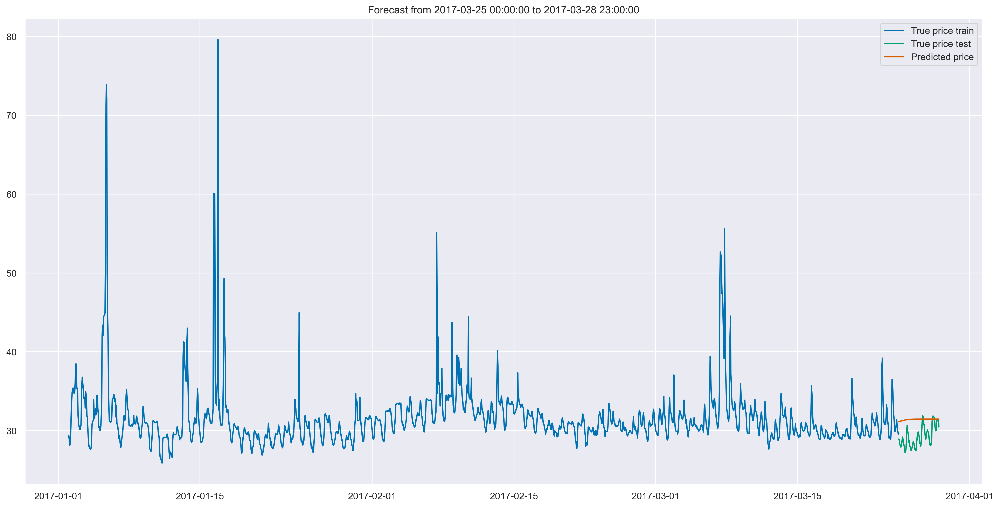

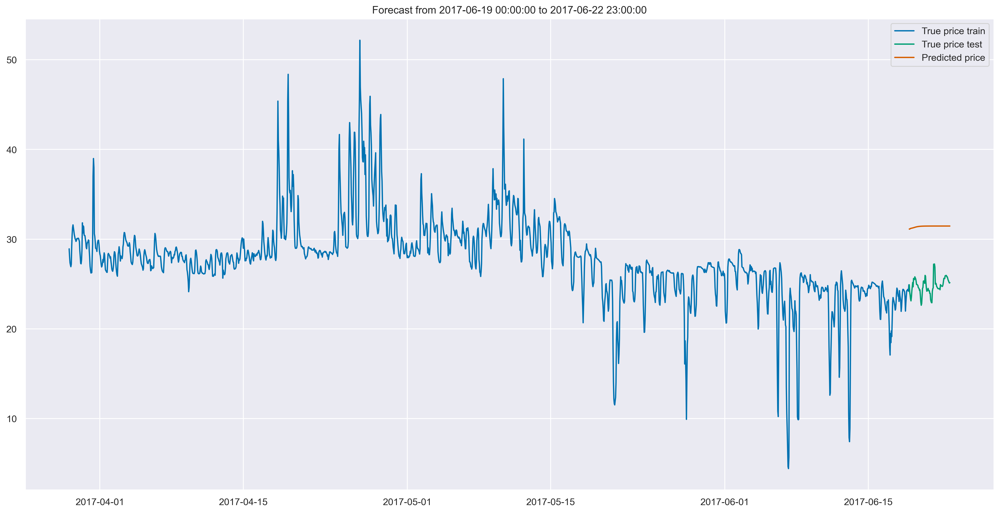

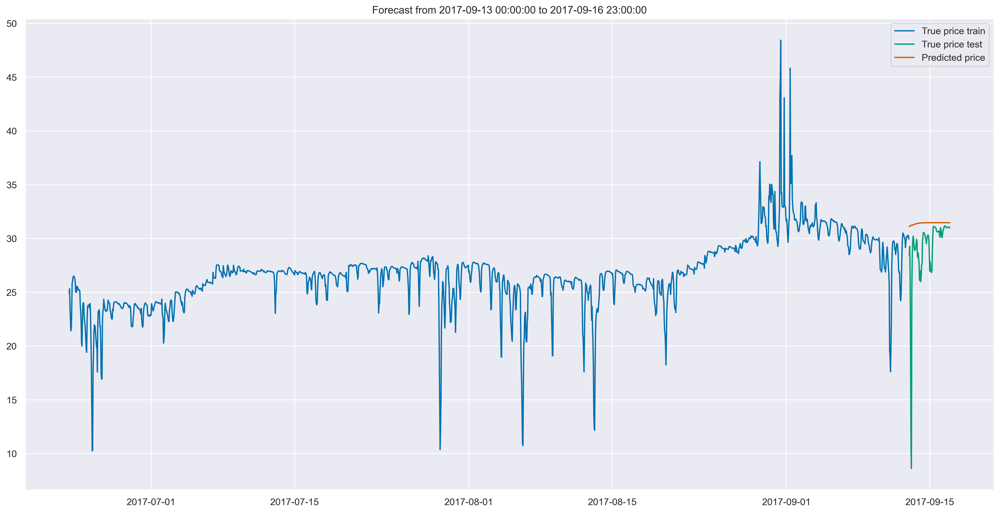

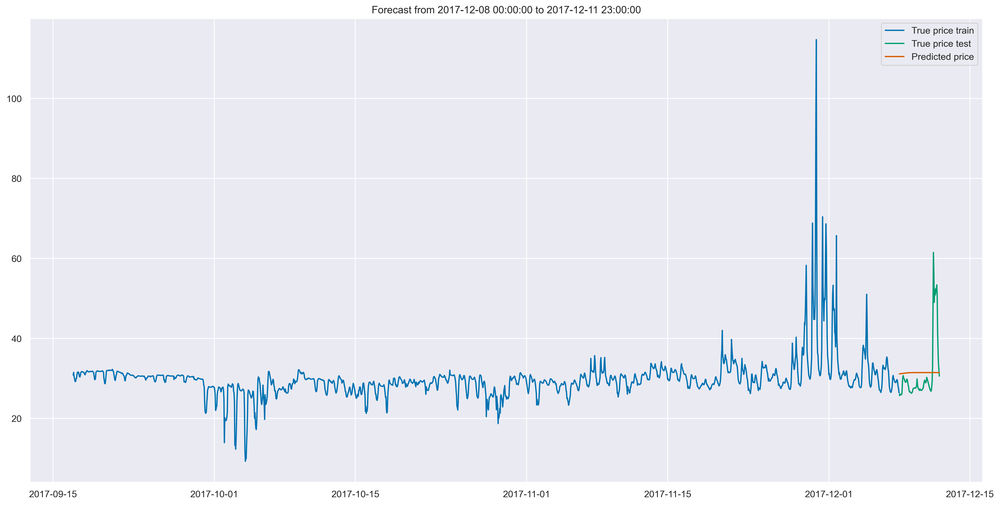

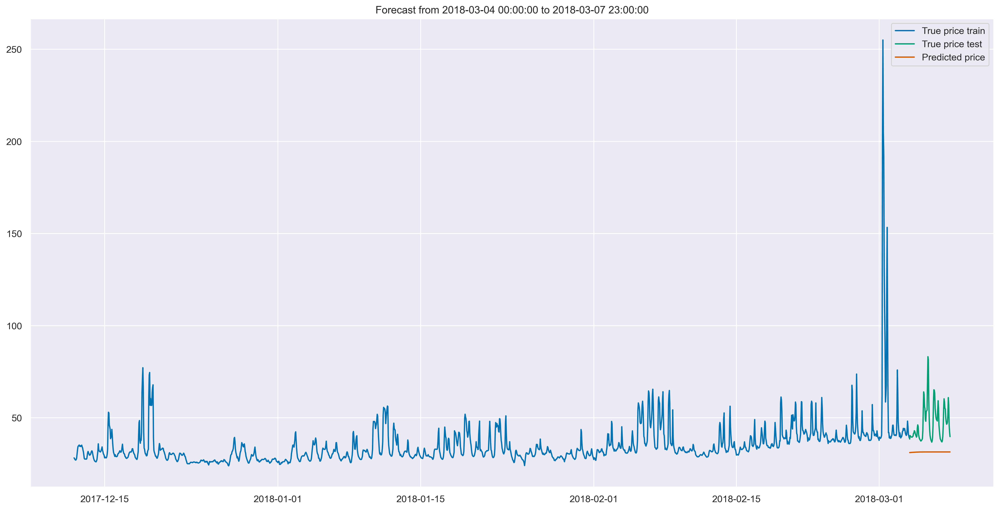

...

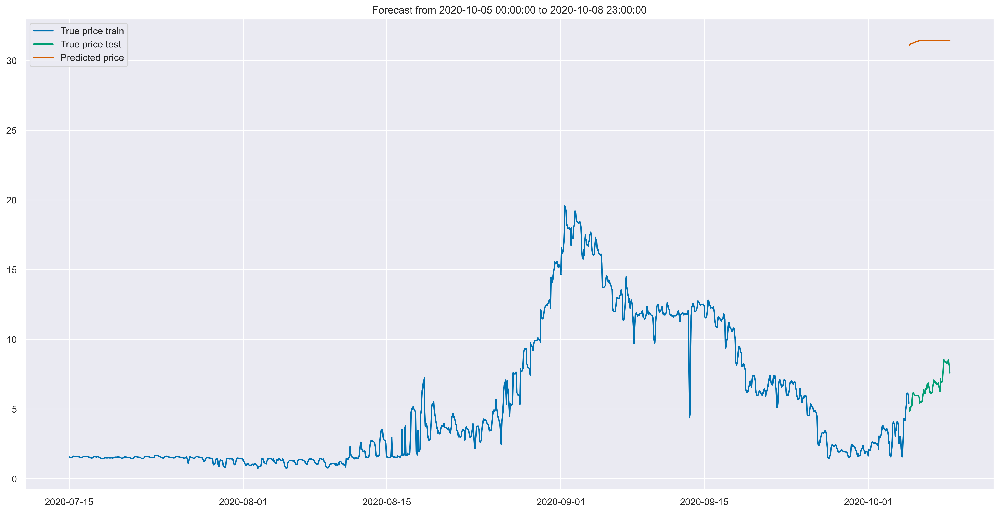

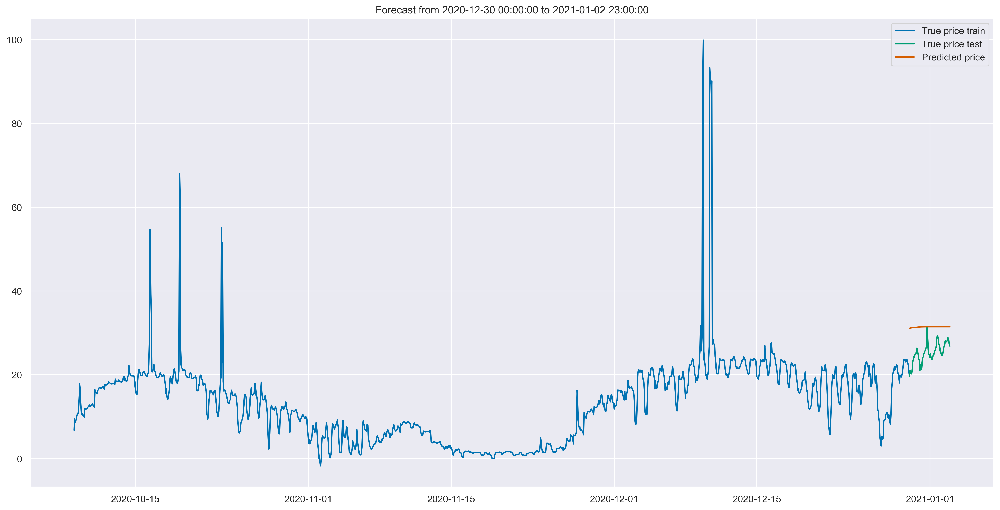

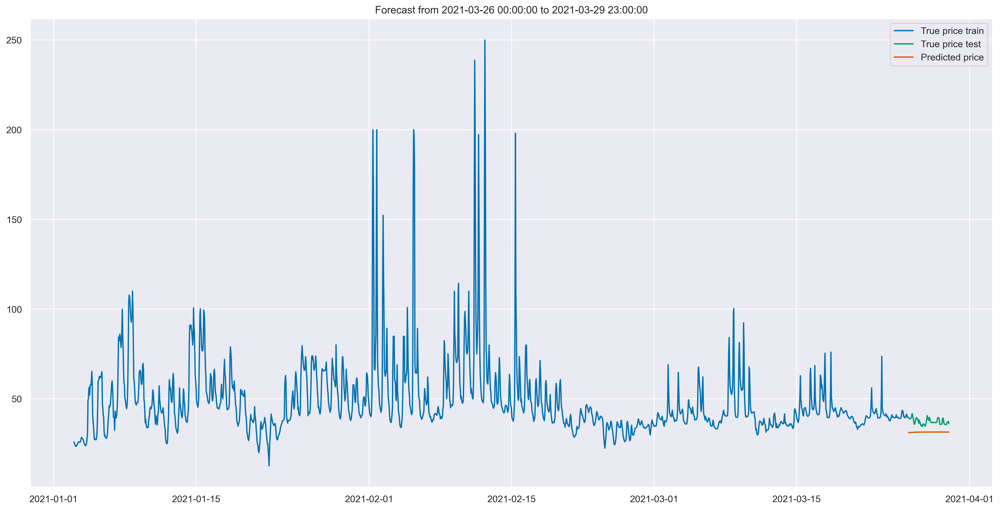

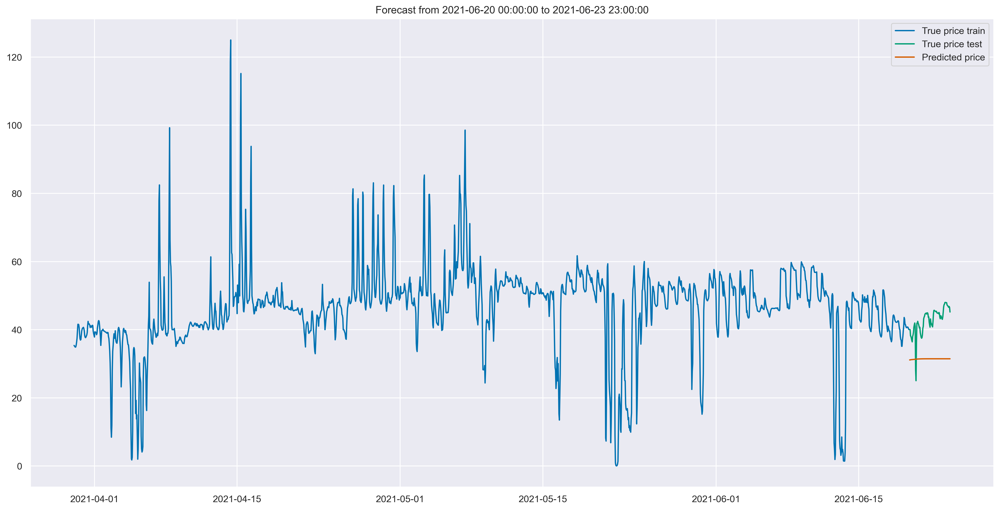

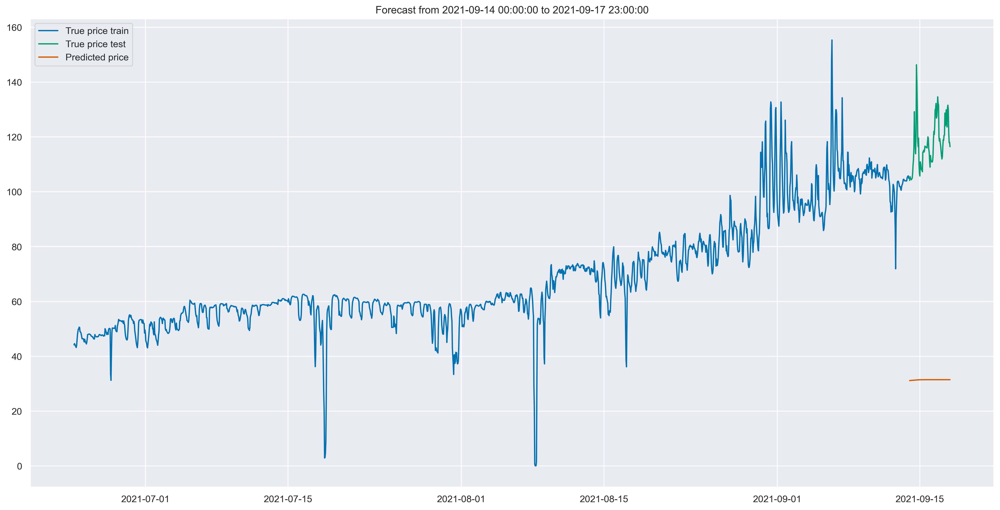

In [13]:
for ii in range(folds):
    #if ii == 5:
    #    break
    fig = plt.figure(figsize=(20,10))
    plt.plot(data[(indexes[ii][0]-train_size):indexes[ii][0]], label = "True price train")
    plt.plot(data[indexes[ii][0]:indexes[ii][1]], label = "True price test")
    #len(data[indexes[0][0]:indexes[0][1]].index)
    plt.plot(data[indexes[ii][0]:indexes[ii][1]].index, predsd[ii], label = "Predicted price")
    plt.title(f'Forecast from {data[indexes[ii][0]:indexes[ii][1]].index[0]} to {data[indexes[ii][0]:indexes[ii][1]].index[-1]}')
    plt.legend()
    fig.savefig(f'Plots/Pred LSTM_2 Fold {ii+1}.jpg', bbox_inches='tight', dpi=150)
    plt.show()   

### RMSE

In [17]:
###### De-normalized RMSE ######
rmse = []
rmse = [(np.sqrt(mean_squared_error(
    data[indexes[ii][0]:indexes[ii][1]], predsd[ii])))
                 for ii in range(folds)]
rmse[0] # Check that it is not in the 0.01 range

2.515423171587968

Fold 1 has  a MAPE of 7.76 % and an RMSE of 2.5154
Fold 2 has  a MAPE of 26.86 % and an RMSE of 6.681
Fold 3 has  a MAPE of 11.52 % and an RMSE of 4.0577
Fold 4 has  a MAPE of 15.5 % and an RMSE of 8.0516
Fold 5 has  a MAPE of 30.95 % and an RMSE of 18.5028
Fold 6 has  a MAPE of 24.58 % and an RMSE of 10.7329
Fold 7 has  a MAPE of 37.63 % and an RMSE of 19.0229
Fold 8 has  a MAPE of 33.14 % and an RMSE of 16.2901
Fold 9 has  a MAPE of 33.1 % and an RMSE of 15.7636
Fold 10 has  a MAPE of 26.95 % and an RMSE of 11.7265
Fold 11 has  a MAPE of 20.5 % and an RMSE of 8.2625
Fold 12 has  a MAPE of 19.76 % and an RMSE of 8.1069
Fold 13 has  a MAPE of 51.19 % and an RMSE of 10.6334
Fold 14 has  a MAPE of 558.8 % and an RMSE of 26.5964
Fold 15 has  a MAPE of 1906.73 % and an RMSE of 29.8523
Fold 16 has  a MAPE of 386.47 % and an RMSE of 24.8462
Fold 17 has  a MAPE of 25.31 % and an RMSE of 6.543
Fold 18 has  a MAPE of 15.8 % and an RMSE of 6.1947
Fold 19 has  a MAPE of 26.43 % and an RMSE of 11.

<Figure size 3000x1500 with 0 Axes>

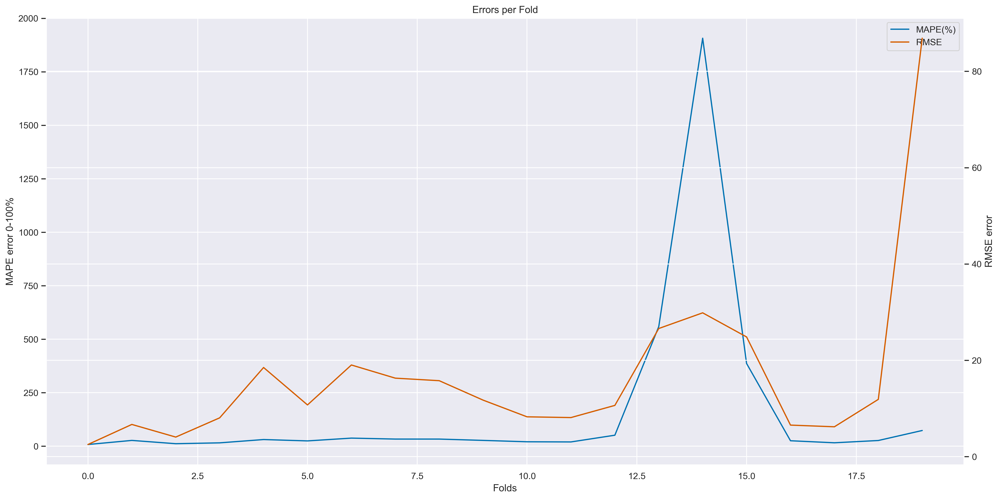

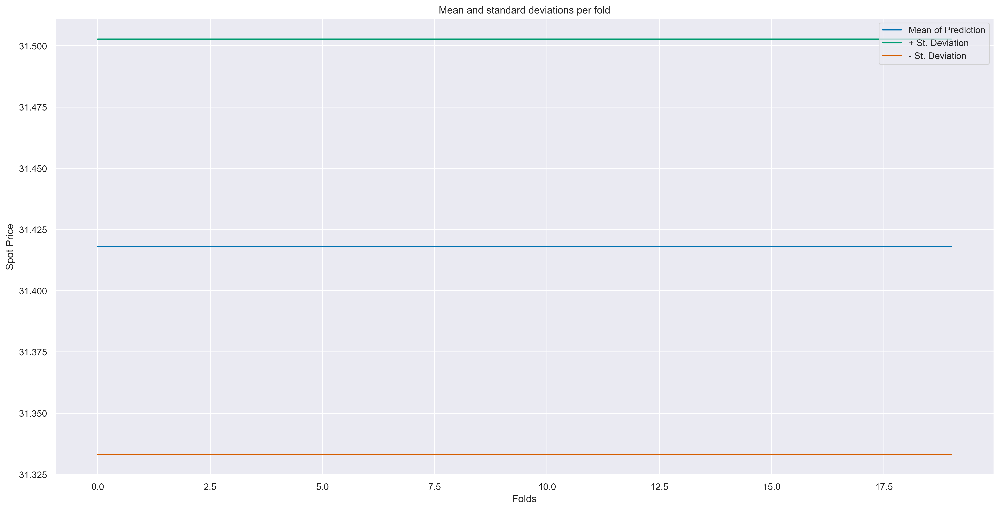

In [18]:
mape =[]
means = []
stdup = []
stddown = []
for ii in range(folds):
    val = calculate_mape(data[indexes[ii][0]:indexes[ii][1]], predsd[ii])
    mape.append(val)
    means.append(np.mean(predsd[ii]))
    stdup.append(np.mean(predsd[ii]) + np.std(predsd[ii]))
    stddown.append(np.mean(predsd[ii]) - np.std(predsd[ii]))
    print(f'Fold {ii+1} has  a MAPE of {val} % and an RMSE of {round(rmse[ii], 4)}')
print(f' Average MAPE: {np.mean(mape)}')
print(f' Average RMSE: {np.mean(rmse)}')

###### Error Plots ######    
plt.suptitle("Prediction comparison by Fold")
fig1, ax1 = plt.subplots()
ax1.set_xlabel('Folds')
ax1.set_ylabel('MAPE error 0-100%')
a, = ax1.plot(mape, "C0", label = "MAPE(%)")
ax2 = ax1.twinx() # Adding Twin Axes
ax2.set_ylabel("RMSE error")
b, = ax2.plot(rmse, "C2", label = "RMSE")
p = [a, b]
ax1.legend(p, [p_.get_label() for p_ in p], loc= 'best')
plt.title("Errors per Fold")
plt.savefig(f'Plots/Pred LSTM_2 Errors per Fold.jpg', bbox_inches='tight', dpi=150)
plt.show()


###### Prediction Plots ######
fig3, ax3 = plt.subplots()   
ax3.set_xlabel('Folds') 
ax3.set_ylabel('Spot Price') 
ax3.plot(means, label = "Mean of Prediction")
ax3.plot((stdup), label = "+ St. Deviation")
ax3.plot((stddown), label = "- St. Deviation")
plt.title("Mean and standard deviations per fold")
plt.legend()
plt.savefig(f'Plots/Pred LSTM_2 Mean and standard deviation.jpg', bbox_inches='tight', dpi=150)
plt.show()

### Time-related

In [19]:
preds_values = [val for matrix in predsd
          for sublist in matrix
         for val in sublist]
preds_idx = [data[idx_rng[0]:idx_rng[1]].index for idx_rng in indexes]
preds_idx = [pd.to_datetime(val) for matrix in preds_idx
          for val in matrix]
#preds_idx

In [20]:
preds_df = pd.DataFrame(data=preds_values, index = preds_idx)
preds_df.reset_index(inplace = True)
preds_df.columns = ["datetime", "Predicted Price"]
preds_df["hour"] = preds_df["datetime"].dt.hour
preds_df["dayofweek"] = preds_df["datetime"].dt.weekday
#true_test = data.reset_index()
preds_df = preds_df.merge(data, how = "left", on = "datetime")
# Square root of the incremental mean of the difference
preds_df["RMSE"] = np.sqrt(((preds_df["Predicted Price"] - preds_df.price)**2).expanding().mean()) 

In [21]:
folder = "Plots/"
subfolder = "LSTM_2/"
filename = "/Preds"
filetype = ".csv"
preds_df.to_csv(path_or_buf=folder+subfolder+filename+filetype)
preds_df.head() # Data check

,datetime,Predicted Price,hour,dayofweek,price,RMSE
0,2017-03-25 00:00:00,31.128286,0,5,28.93,2.198286
1,2017-03-25 01:00:00,31.119352,1,5,28.82,2.249387
2,2017-03-25 02:00:00,31.174024,2,5,28.34,2.459754
3,2017-03-25 03:00:00,31.191397,3,5,28.17,2.611514
4,2017-03-25 04:00:00,31.206812,4,5,28.03,2.733940


hour
0     11.267854
1     11.276577
2     11.287676
3     11.298846
4     11.311329
5     11.323633
6     11.331727
7     11.339945
8     11.351357
9     11.367407
10    11.381945
11    11.395489
12    11.408201
13    11.419682
14    11.431351
15    11.443870
16    11.457204
17    11.470361
18    11.484830
19    11.500703
20    11.514366
21    11.522889
22    11.529955
23    11.536512
Name: RMSE, dtype: float64

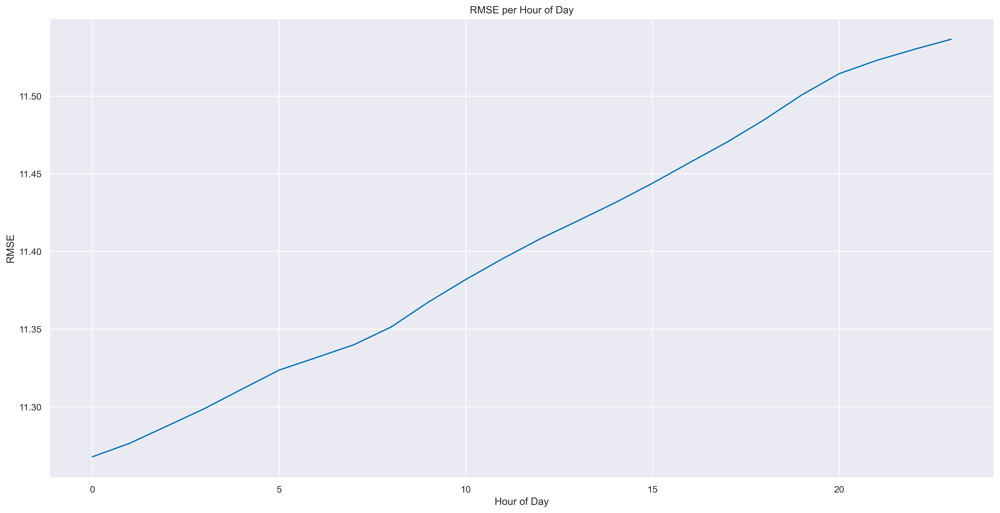

In [22]:
hour_preds = preds_df.groupby("hour")["RMSE"].mean()
display(hour_preds)
plt.plot(hour_preds,"C0")
plt.xlabel('Hour of Day') 
plt.ylabel('RMSE') 
plt.title("RMSE per Hour of Day")
plt.savefig(f'Plots/LSTM_2 Hourly error.jpg', bbox_inches='tight', dpi=150)
#plt.savefig(f'Plots/Pred {my_order} Hourly error.jpg', bbox_inches='tight', dpi=150)
plt.show()

dayofweek
0    10.602326
1    11.335759
2    12.017822
3    12.050086
4    12.242195
5    10.727442
6    10.862836
Name: RMSE, dtype: float64

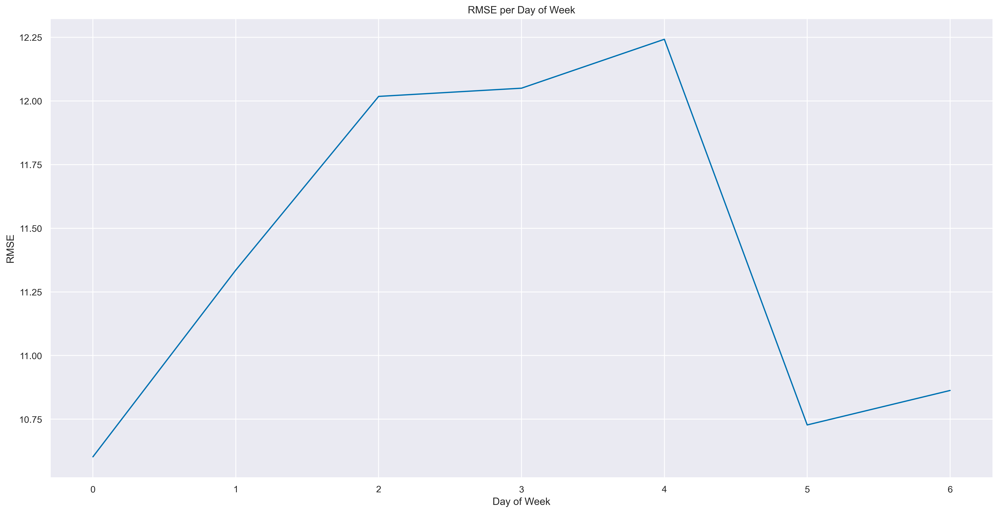

In [23]:
preds_df["dayofweek"] = preds_df["datetime"].dt.dayofweek
weekday_preds = preds_df.groupby("dayofweek")["RMSE"].mean()
display(weekday_preds)
plt.plot(weekday_preds,"C0")
plt.xlabel('Day of Week') 
plt.ylabel('RMSE') 
plt.title("RMSE per Day of Week")
plt.savefig(f'Plots/LSTM_2 Day of Week error.jpg', bbox_inches='tight', dpi=150)
plt.show()

dayofweek,0,1,2,3,4,5,6
hour,,,,,,,
0,10.421056,11.136811,11.864464,11.908474,12.139039,10.641317,10.798474
1,10.428391,11.149513,11.872795,11.920283,12.148339,10.648867,10.802311
2,10.437026,11.162818,11.881824,11.931406,12.157044,10.670147,10.808134
3,10.446242,11.176709,11.895490,11.942452,12.165309,10.686347,10.813748
4,10.455967,11.190679,11.920429,11.953221,12.173026,10.699824,10.819512
5,10.463638,11.203742,11.947998,11.963376,12.180835,10.711710,10.826450
6,10.469165,11.216077,11.956178,11.974358,12.189223,10.716296,10.832952
7,10.474645,11.229080,11.966214,11.985892,12.198027,10.719018,10.838545
8,10.492954,11.250049,11.980102,11.998761,12.206785,10.717411,10.843523


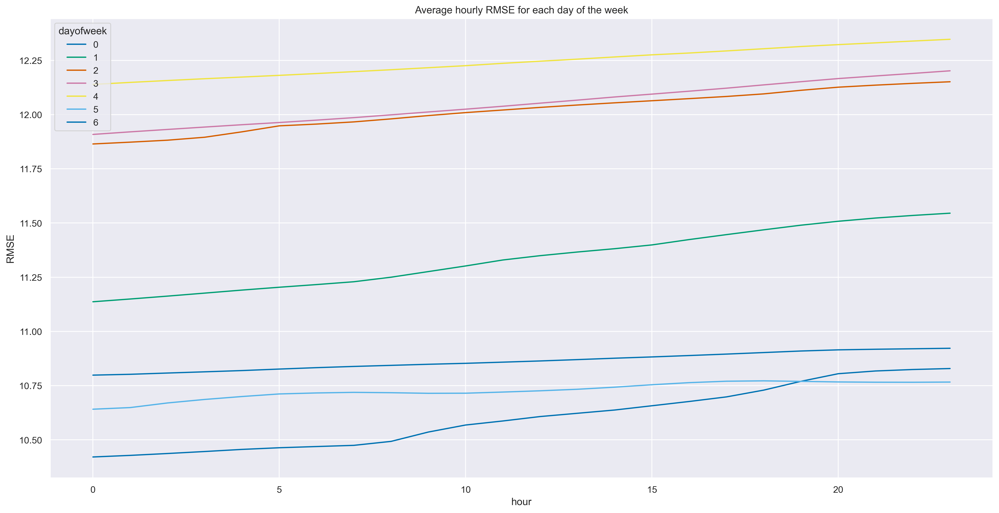

In [24]:
hour_day = pd.pivot_table(data = preds_df, values="RMSE",
                            index = "hour", columns="dayofweek",
                            aggfunc="mean")
display(hour_day)
hour_day.plot()
plt.ylabel("RMSE")
plt.title("Average hourly RMSE for each day of the week")
plt.savefig(f'Plots/LSTM_2 Average hourly RMSE for each day.jpg', bbox_inches='tight', dpi=150)
plt.show()